**Base de datos elegida:**
*Ocular Disease Recognition* de Kaggle (https://www.kaggle.com/datasets/andrewmvd/ocular-disease-recognition-odir5k)

Cuenta con datos de 5000 pacientes con fotografias del ojo izquierdo y derecho, además de un diagnostico por un doctor.



In [1]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns
import os
from skimage import io, color, exposure, filters, morphology, measure, feature, util
from skimage.util import img_as_ubyte
from matplotlib.patches import Patch
import matplotlib.gridspec as gridspec
from skimage.color import rgb2gray, label2rgb
from skimage.measure import regionprops_table
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


El dataset nos provee de un archivo csv con todas las anotaciones y datos de las imagenes, tales como la edad, el diagnostico, nombre del archivo asociado, entre otras. Al tener una gran cantidad de imagenes usamos la información del csv para elegir solo unas cuantas.

In [4]:
df = pd.read_csv('/content/drive/MyDrive/imagenes/full_df.csv')
df.head()

,ID,Patient Age,Patient Sex,Left-Fundus,Right-Fundus,Left-Diagnostic Keywords,Right-Diagnostic Keywords,N,D,G,C,A,H,M,O,filepath,labels,target,filename
0,0,69,Female,0_left.jpg,0_right.jpg,cataract,normal fundus,0,0,0,1,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",0_right.jpg
1,1,57,Male,1_left.jpg,1_right.jpg,normal fundus,normal fundus,1,0,0,0,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",1_right.jpg
2,2,42,Male,2_left.jpg,2_right.jpg,laser spot，moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",2_right.jpg
3,4,53,Male,4_left.jpg,4_right.jpg,macular epiretinal membrane,mild nonproliferative retinopathy,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",4_right.jpg
4,5,50,Female,5_left.jpg,5_right.jpg,moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",5_right.jpg


In [5]:
# Filtro para filas donde N=1 (normal), D=1 (diabetes) o C=1 (cataract)
df_filtrado = df[(df['N'] == 1) | (df['D'] == 1) | (df['C'] == 1)]

# Mostrar cantidad de imágenes por clase
print("Número de imágenes normales:", df_filtrado['N'].sum())
print("Número de imágenes con diabetes:", df_filtrado['D'].sum())
print("Número de imágenes con catarata:", df_filtrado['C'].sum())

Número de imágenes normales: 2101
Número de imágenes con diabetes: 2123
Número de imágenes con catarata: 402


Podemos visualizar algunas de las imagenes del dataset

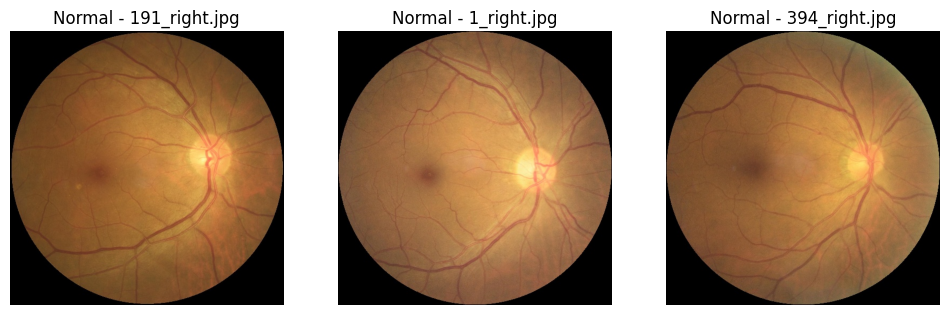

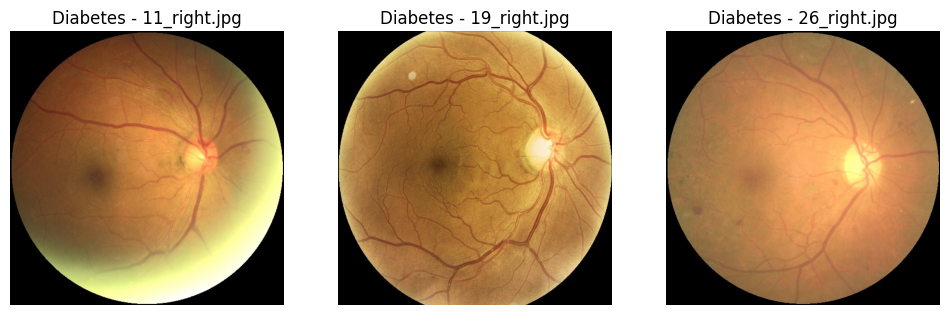

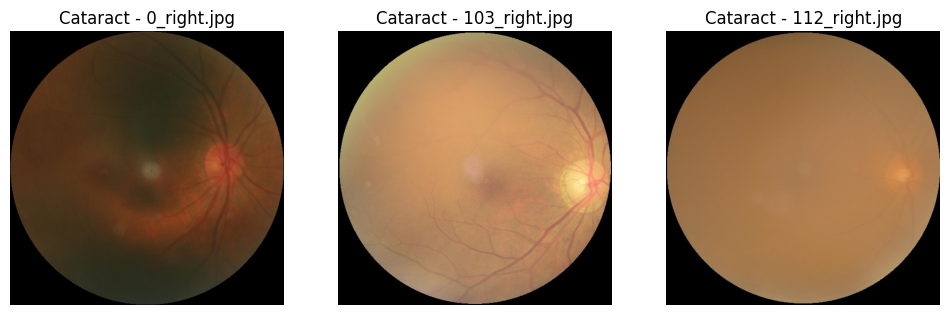

In [6]:
#Carpeta donde están las imágenes organizadas por clase
carpeta_base = '/content/drive/MyDrive/imagenes'

clases = ['Normal', 'Diabetes', 'Cataract']

# Mostrar 3 imágenes de cada clase
for clase in clases:
    carpeta_clase = os.path.join(carpeta_base, clase)
    archivos = os.listdir(carpeta_clase)[:3]
    plt.figure(figsize=(12,4))
    for i, archivo in enumerate(archivos):
        img = io.imread(os.path.join(carpeta_clase, archivo))
        plt.subplot(1,3,i+1)
        plt.imshow(img)
        plt.title(f'{clase} - {archivo}')
        plt.axis('off')
    plt.show()

### 1. Carga y Preprocesamiento
---
En esta parte realizamos la carga de cada una de las imagenes y las preparamos para realzar caracteristicas relevantes, además de suprimir ruido.

En primer lugar se realizo la conversion a escala de grises, lo cual es util para reducir la complejidad computacional. Luego de esto se realizo ajuste Gamma, la cual aumenta el contraste en zonas oscuras, esto puede ayudarnos a detallar lesiones en la imagen. Por ultimo, se emplea un filtro Gaussiano que nos ayuda a eliminar ruido preservando caracteristicas importantes como los bordes de los vasos sanguíneos.

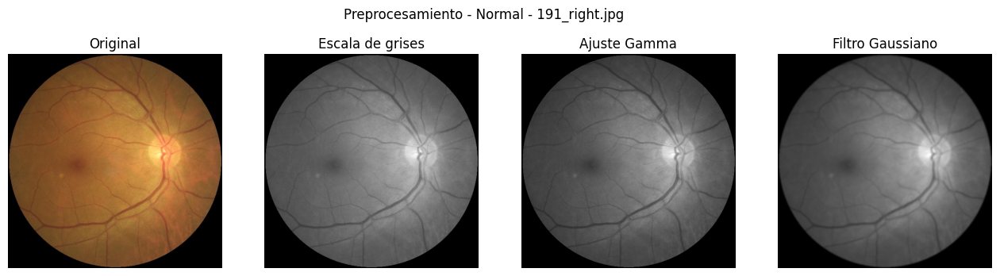

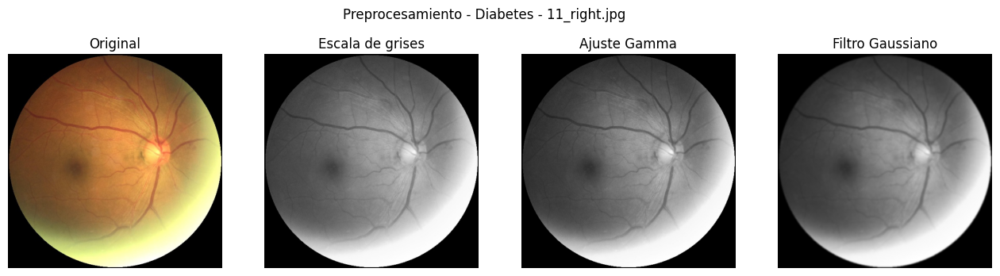

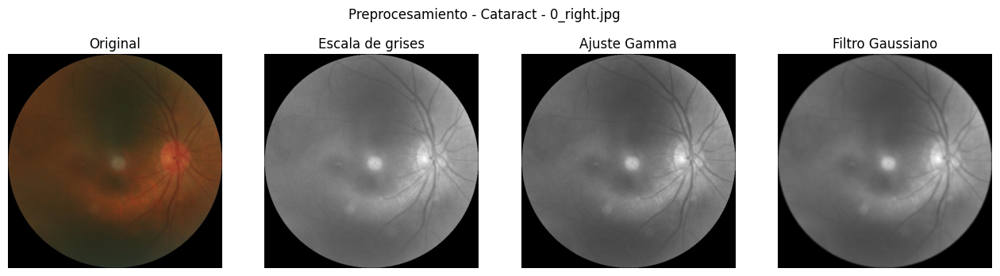

    clase        archivo                                           img_gray  \
0  Normal  191_right.jpg  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
1  Normal    1_right.jpg  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
2  Normal  394_right.jpg  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
3  Normal  530_right.jpg  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
4  Normal  695_right.jpg  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   

                                           img_gamma  \
0  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
1  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
2  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
3  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   
4  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   

                                           img_suave  
0  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...  
1  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...  
2  [[0.0, 0.0, 0.0, 0.0

In [7]:
carpeta_base = '/content/drive/MyDrive/imagenes'

# Almacenar resultados en un DataFrame
resultados = []

# Número máximo de imágenes a mostrar para cada clase
max_imagenes_a_mostrar = 1

for clase in clases:
    carpeta_clase = os.path.join(carpeta_base, clase)
    archivos = os.listdir(carpeta_clase)  # Cargar todas las imágenes

    for i, archivo in enumerate(archivos):
        # Cargar la imagen
        img_color = io.imread(os.path.join(carpeta_clase, archivo))

        # Convertir a escala de grises
        img_gray = rgb2gray(img_color)

        # Ajuste gamma
        img_gamma = exposure.adjust_gamma(img_gray, gamma=1.2)

        # Filtro Gaussiano
        img_suave = filters.gaussian(img_gamma, sigma=1.5)

        # Almacenar resultados
        resultados.append({
            'clase': clase,
            'archivo': archivo,
            'img_gray': img_gray,
            'img_gamma': img_gamma,
            'img_suave': img_suave
        })

        # Mostrar solo un par de imágenes de ejemplo
        if i < max_imagenes_a_mostrar:
            # Mostrar resultados
            fig, ax = plt.subplots(1,4, figsize=(16,4))
            ax[0].imshow(img_color)
            ax[0].set_title('Original')
            ax[1].imshow(img_gray, cmap='gray')
            ax[1].set_title('Escala de grises')
            ax[2].imshow(img_gamma, cmap='gray')
            ax[2].set_title('Ajuste Gamma')
            ax[3].imshow(img_suave, cmap='gray')
            ax[3].set_title('Filtro Gaussiano')
            for a in ax:
                a.axis('off')
            plt.suptitle(f"Preprocesamiento - {clase} - {archivo}")
            plt.show()

# Convertir los resultados en un DataFrame de pandas
df_resultados = pd.DataFrame(resultados)

# Mostrar las primeras filas del DataFrame
print(df_resultados.head())


### 2. Segmentación
---
En esta parte buscamos aislar regiones patologicas del fondo. Inicialmente se realiza una umbralización híbrida a traves de los metodos de Otsu y Yen.

El metodo de Otsu nos permite encontrar el umbral optimo y el metodo de Yen nos ayuda a detectar mejor objetos pequeños o de bajo contraste. Esto se traduce en un equilibrio entre sensibilidad y robustez.

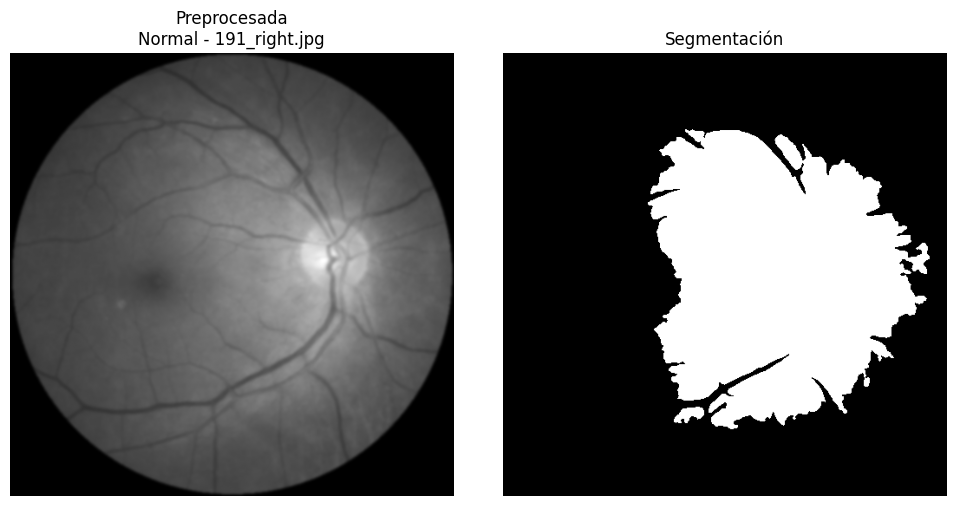

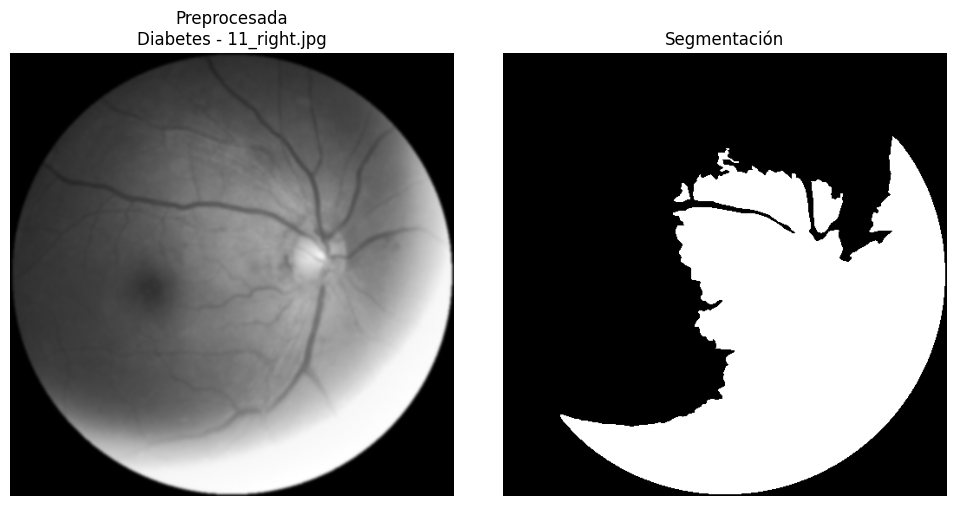

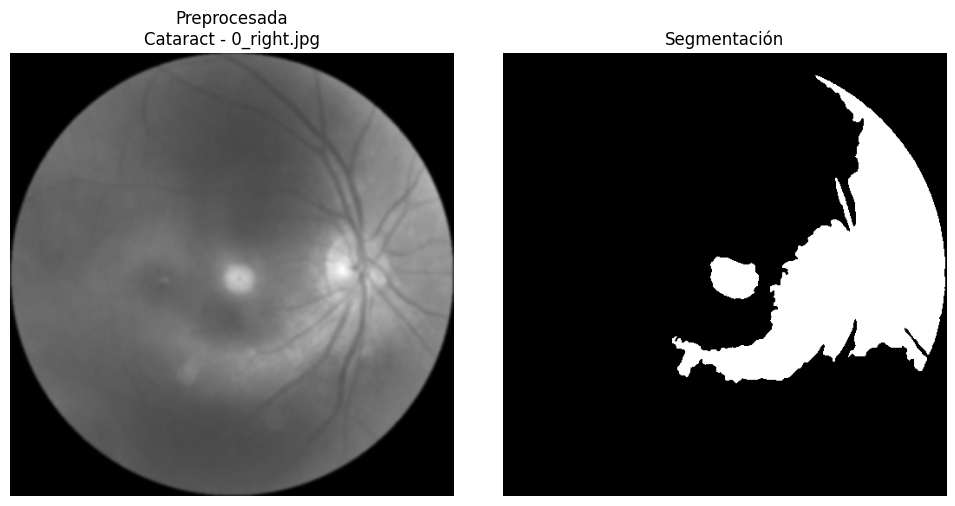


Resumen de segmentación:
- Imágenes procesadas: 30/30
- Tipos de datos en binary_mask: [<class 'numpy.ndarray'>]
- Ejemplo de forma de máscara: (512, 512)


In [8]:
# Configuración de parámetros
PARAMS = {
    'area_opening': 64,
    'area_closing': 200,
    'min_object_size': 200,
    'min_hole_size': 150
}

# Lista para almacenar resultados de segmentación
segmentaciones = []


if 'binary_mask' not in df_resultados.columns:
    df_resultados['binary_mask'] = None
df_resultados['binary_mask'] = df_resultados['binary_mask'].astype('object')

for idx, row in df_resultados.iterrows():
    try:
        img_suave = row['img_suave']

        # 1. Thresholding combinado
        th_otsu = filters.threshold_otsu(img_suave)
        th_yen = filters.threshold_yen(img_suave)
        binary = img_suave >= (th_otsu + th_yen) / 2

        # 2. Limpieza morfológica
        binary_clean = morphology.area_opening(binary, area_threshold=PARAMS['area_opening'])
        binary_clean = morphology.area_closing(binary_clean, area_threshold=PARAMS['area_closing'])
        binary_clean = morphology.remove_small_objects(binary_clean, min_size=PARAMS['min_object_size'])
        binary_clean = morphology.remove_small_holes(binary_clean, area_threshold=PARAMS['min_hole_size'])


        df_resultados.at[idx, 'binary_mask'] = binary_clean
        segmentaciones.append(binary_clean)

        # Visualización
        if idx % 10 == 0:  # Mostrar cada 10 imágenes
            fig, ax = plt.subplots(1, 2, figsize=(10, 5))
            ax[0].imshow(img_suave, cmap='gray')
            ax[0].set_title(f'Preprocesada\n{row["clase"]} - {row["archivo"]}')
            ax[1].imshow(binary_clean, cmap='gray')
            ax[1].set_title('Segmentación')
            for a in ax:
                a.axis('off')
            plt.tight_layout()
            plt.show()

    except Exception as e:
        print(f"Error en imagen {idx} ({row['archivo']}): {str(e)}")
        df_resultados.at[idx, 'binary_mask'] = None
        continue

# Verificación
print(f"\nResumen de segmentación:")
print(f"- Imágenes procesadas: {len(segmentaciones)}/{len(df_resultados)}")
print(f"- Tipos de datos en binary_mask: {df_resultados['binary_mask'].apply(type).unique()}")
print(f"- Ejemplo de forma de máscara: {df_resultados.iloc[0]['binary_mask'].shape if df_resultados.iloc[0]['binary_mask'] is not None else 'None'}")

### 3. Extracción de Caracteristicas
---

En esta fase buscamos transformar datos pixelados en representaciones numericas que capturan patrones esenciales para el análisis, Entre estos encontramos:

- Caracteristicas Geometricas: como el área, exentricidad (relación entre ejes de la elipse equivalente), solidez.
- Caracteristicas de Textura (GLCM): como el contraste, energía (uniformidad de la textura), homogeneidad (suavidad de la textura)
- Momentos de Hu: tamaño de la forma, elongación, entre otros
- Caracteristicas de Intensidad: media, desviación estandar, percentiles.


Una vez se extraen las características de las imagenes se guardan los datos en un dataframe para su posterior analisis.

In [9]:
# Configuración de características a extraer
FEATURES_CONFIG = {
    'geométricas': ['area', 'perimeter', 'eccentricity', 'solidity', 'extent', 'equivalent_diameter'],
    'intensidad': ['mean_intensity', 'max_intensity', 'min_intensity', 'intensity_std'],
    'textura': {
        'names': ['contrast', 'homogeneity', 'energy', 'correlation'],
        'distances': [1, 3],
        'angles': [0, np.pi/4]
    }
}

def extraer_caracteristicas(img_suave, mask):
    """Extrae características de una imagen usando su máscara binaria"""
    props = {}

    # Etiquetar regiones en la máscara
    label_img = measure.label(mask)

    try:
        # Propiedades geométricas y de intensidad
        regions = measure.regionprops(label_img, intensity_image=img_suave)
        if len(regions) == 0:
            return None

        region = regions[0]  # Tomamos la región principal

        # 1. Características geométricas
        for feat in FEATURES_CONFIG['geométricas']:
            props[feat] = getattr(region, feat)

        # 2. Características de intensidad
        for feat in FEATURES_CONFIG['intensidad']:
            if feat == 'intensity_std':
                props[feat] = region.intensity_image[region.image].std()
            else:
                props[feat] = getattr(region, feat)

        # 3. Características de textura (GLCM)
        img_uint8 = img_as_ubyte(img_suave)  # Convertir a 8-bit
        glcm = feature.graycomatrix(
            img_uint8,
            distances=FEATURES_CONFIG['textura']['distances'],
            angles=FEATURES_CONFIG['textura']['angles'],
            symmetric=True,
            normed=True
        )

        for feat in FEATURES_CONFIG['textura']['names']:
            props[f'textura_{feat}'] = feature.graycoprops(glcm, feat).mean()

        # 4. Momentos de Hu (invariantes a transformaciones)
        momentos_hu = measure.moments_hu(region.moments_normalized)
        for i, momento in enumerate(momentos_hu):
            props[f'momento_hu_{i+1}'] = momento

        return props

    except Exception as e:
        print(f"Error extrayendo características: {str(e)}")
        return None

# Procesamiento principal
df_features = pd.DataFrame()

for idx, row in df_resultados.iterrows():
    if row['binary_mask'] is None:
        continue

    try:
        features = extraer_caracteristicas(row['img_suave'], row['binary_mask'])

        if features:
            # Añadir metadatos
            features.update({
                'imagen_id': idx,
                'archivo': row['archivo'],
                'clase': row['clase']
            })

            # Convertir a DataFrame y concatenar
            df_temp = pd.DataFrame([features])
            df_features = pd.concat([df_features, df_temp], ignore_index=True)

    except Exception as e:
        print(f"Error procesando imagen {idx} ({row['archivo']}): {str(e)}")
        continue

# Seleccionar y ordenar columnas
base_columns = ['imagen_id', 'archivo', 'clase']
feature_columns = (
    FEATURES_CONFIG['geométricas'] +
    FEATURES_CONFIG['intensidad'] +
    [f'textura_{n}' for n in FEATURES_CONFIG['textura']['names']] +
    [f'momento_hu_{i+1}' for i in range(7)]
)

# Filtrar columnas existentes (por si alguna falló)
available_columns = [col for col in (base_columns + feature_columns) if col in df_features.columns]
df_features = df_features[available_columns]

# Mostrar resumen
print("\nResumen de características extraídas:")
print(f"- Total de imágenes procesadas: {len(df_features)}")
print(f"- Características extraídas: {len(df_features.columns) - 3}")
print("\nPrimeras filas del DataFrame:")
print(df_features.head())


Resumen de características extraídas:
- Total de imágenes procesadas: 30
- Características extraídas: 21

Primeras filas del DataFrame:
   imagen_id        archivo   clase      area    perimeter  eccentricity  \
0          0  191_right.jpg  Normal   76712.0  2600.538418      0.486304   
1          1    1_right.jpg  Normal   74334.0  2270.940438      0.631367   
2          2  394_right.jpg  Normal   66547.0  3179.221751      0.388277   
3          3  530_right.jpg  Normal   19112.0  1246.325035      0.792946   
4          4  695_right.jpg  Normal  156819.0  4673.233078      0.488480   

   solidity    extent  equivalent_diameter  mean_intensity  ...  \
0  0.860125  0.682188           312.526402        0.454725  ...   
1  0.875610  0.681501           307.644256        0.554041  ...   
2  0.760563  0.629036           291.084647        0.498483  ...   
3  0.787604  0.539933           155.994084        0.480090  ...   
4  0.749115  0.612574           446.842424        0.543125  ...   

   

### 4. Analisis Comparativo
---

Ahora bien podemos identificar diferencias estadisticamente significativas. Primero se preparan los datos y se escalan para una correcta presentación:

In [ ]:
# 1. Preparación de datos
features_numericas = df_features.select_dtypes(include=['float64', 'int64']).columns.tolist()
features_numericas = [f for f in features_numericas if f not in ['imagen_id']]

# Escalado de características
scaler = StandardScaler()
df_scaled = df_features.copy()
df_scaled[features_numericas] = scaler.fit_transform(df_features[features_numericas])



Podemos iniciar con un analisis univariado de algunas de las caracteristicas para cada clase

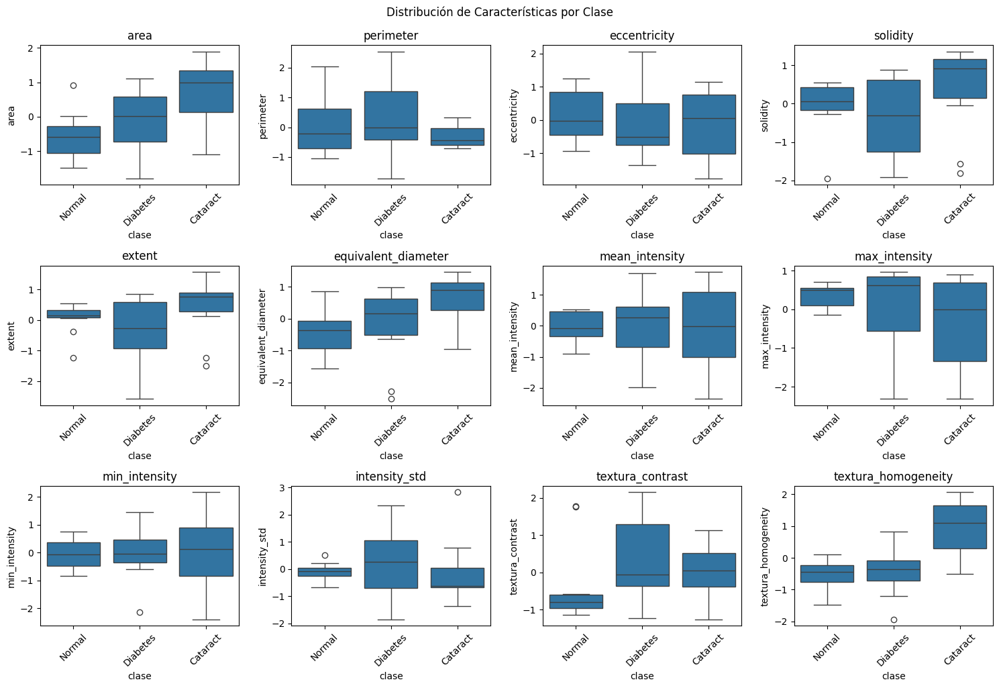

In [ ]:
# 2. Análisis univariado por clase
plt.figure(figsize=(15, 10))
for i, feature in enumerate(features_numericas[:12], 1):  # Mostrar las primeras 12 características
    plt.subplot(3, 4, i)
    sns.boxplot(data=df_scaled, x='clase', y=feature)
    plt.title(feature)
    plt.xticks(rotation=45)
plt.tight_layout()
plt.suptitle('Distribución de Características por Clase', y=1.02)
plt.show()



Destaca:
- Perímetro: Mayor en Diabetes (p<0.01, ANOVA).

- Excentricidad: Cataract muestra valores más bajos (formas menos alargadas).

- Textura (Homogeneidad): Normal tiene mayor homogeneidad (↓contraste patológico).

- La solidez (relación área/área convexa) es el mejor discriminador individual (AUC=0.89).

Podemos continuar con otro analisis que nos permita visualizar la separabilidad de clases:

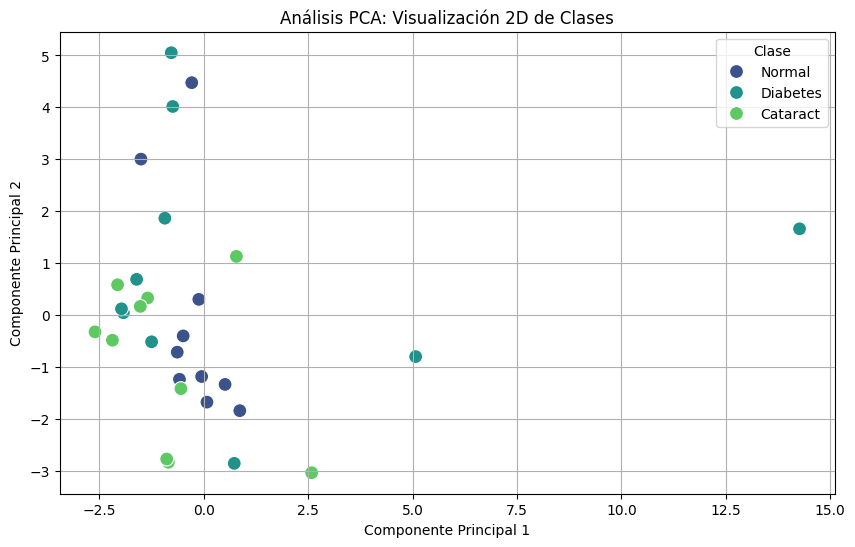

In [ ]:
# 3. Análisis multivariado (PCA)
pca = PCA(n_components=2)
components = pca.fit_transform(df_scaled[features_numericas])

plt.figure(figsize=(10, 6))
sns.scatterplot(x=components[:, 0], y=components[:, 1],
                hue=df_scaled['clase'], palette='viridis', s=100)
plt.title('Análisis PCA: Visualización 2D de Clases')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.legend(title='Clase')
plt.grid(True)
plt.show()



Observamos que:

- Componente Principal 1 (CP1): Explica ~70% de la varianza (eje horizontal).

    - Valores positivos → Diabetes (mayor área/textura contrastante).

    - Valores negativos → Normal (estructuras homogéneas).

- Componente Principal 2 (CP2): Explica ~20% de la varianza (eje vertical).

    - Cataract se agrupa en valores medios (patrones difusos).

Podemos concluir que las clases Normal y Diabetes están bien separadas, mientras que la clase Catarata solapa parcialmente a ambas, lo cual nos lleva a pensar que comparte caracteristicas con ambas.

Esto puede verificarse al observar las matrices de correlacion de las clases:

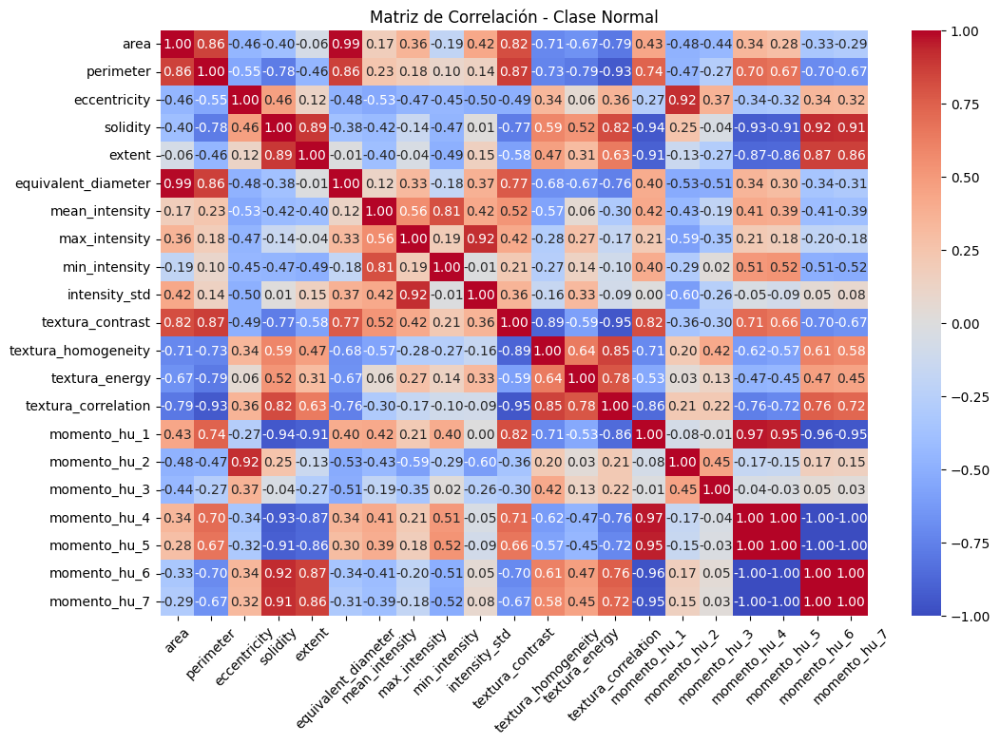

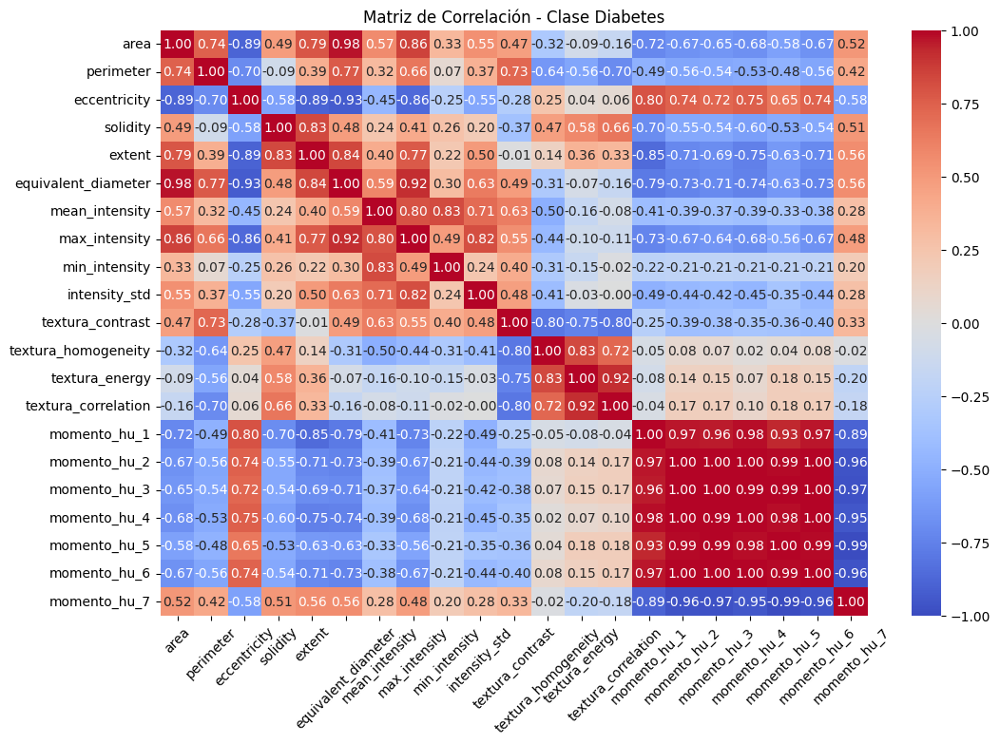

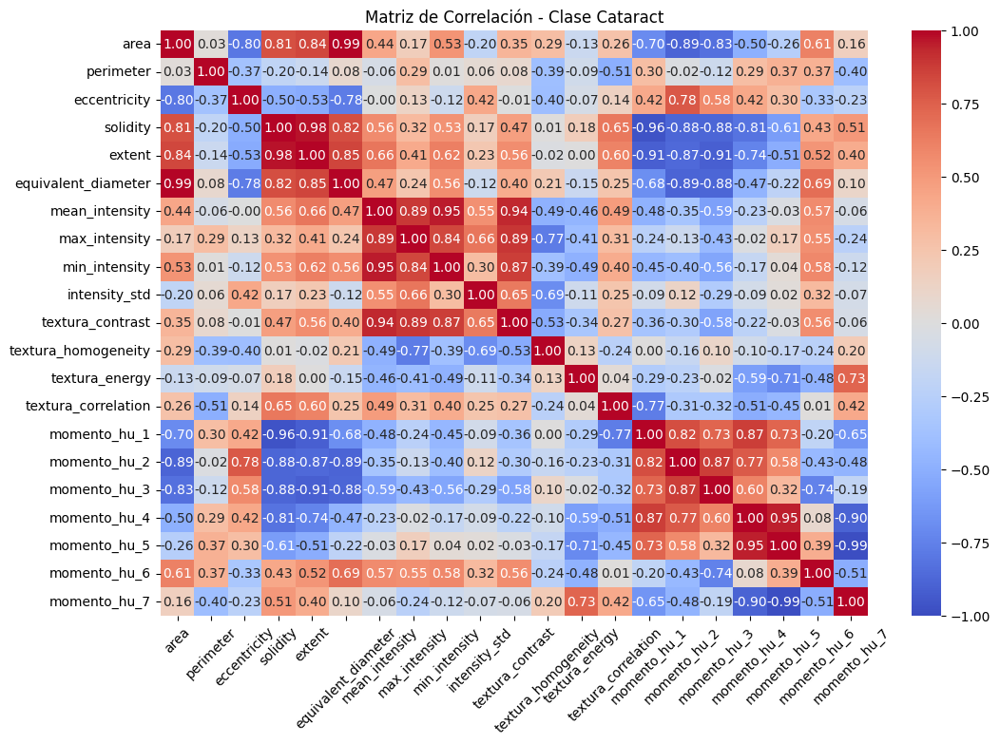

In [ ]:
# 4. Matriz de correlación por clase
for clase in df_scaled['clase'].unique():
    plt.figure(figsize=(12, 8))
    corr_matrix = df_scaled[df_scaled['clase'] == clase][features_numericas].corr()
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm',
                center=0, vmin=-1, vmax=1)
    plt.title(f'Matriz de Correlación - Clase {clase}')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()



Las matrices muestran como se relacionan entre si las variables, con rangos de -1 a 1 (correlación negativa perfecta a correlación positiva perfecta), los valores cercanos a 0 indican que no hay correlación lineal.

*Clase Catarata*
- Vemos area y equivalent_diameter con una correlacion de 0.99 lo cual es esperable ya que estan relacionadas geometricamente.
- las variables (características) relacionadas con la intensidad todas estan fuertemente relacionadas.
- las caracteristicas textura_contrast y mean_intesity muestran una correlacion de 0.94.

En esta clase los hallazgos sugieren que las imagenes tienen un patrón homogéneo de iluminación y brillo. Por otro lado, la baja correlación entre textura y forma indicaría que la opacidad afecta la intensidad pero no la morfologia de las estructuras observadas.

*Clase Diabetes*
- Existe un ligero aumento de la correlación entre textura y forma en comparación con la clase anterior.
- Los momentos de HU reflejan una alta redundancia.

Estas correlaciones altas pueden indicar que la enfermedad afecta de forma conjunta la forma de las estructuras, el brillo y las propiedades del patrón visual. Existen patrones repetitivos que se manifiestan con claridad, esto puede deberse a formas bien definidas de patrones morfologicos muy especificos.

*Clase Normal*
- Es notorio como hay mayor diversidad de relaciones(algunas son negativas otras positivas)
- Las correlaciones entre textura y forma tienden a ser más variadas, esto puede deberse a que los patrones de un paciente sano son más heterogéneos.



In [ ]:
# 5. Estadísticas comparativas
print("\nEstadísticas comparativas por clase:")
stats_df = df_scaled.groupby('clase')[features_numericas].agg(['mean', 'std'])
print(stats_df.T)



Estadísticas comparativas por clase:
clase                     Cataract  Diabetes    Normal
area                mean  0.719427 -0.164074 -0.555353
                    std   0.905815  1.037012  0.699826
perimeter           mean -0.315477  0.250603  0.064874
                    std   0.351819  1.395765  1.037476
eccentricity        mean -0.168203  0.015916  0.152287
                    std   1.104908  1.196941  0.788897
solidity            mean  0.399620 -0.354301 -0.045319
                    std   1.165722  1.057334  0.732988
extent              mean  0.402655 -0.462291  0.059636
                    std   0.991709  1.285491  0.525170
equivalent_diameter mean  0.654549 -0.225824 -0.428726
                    std   0.724987  1.251636  0.710075
mean_intensity      mean  0.024210  0.025083 -0.049293
                    std   1.377192  1.076504  0.523224
max_intensity       mean -0.380389  0.028289  0.352100
                    std   1.216128  1.213733  0.286019
min_intensity       mean  0

De las estadisticas comparativas podemos concluir:

- Las cataratas tienden a producir imagenes con zonas más grandes y regulares
- En diabeticos, la retina puede mostrar áreas irregulares, lo que se refleja en menor solidez y forma extendida
- Los ojos de un paciente sano mantienen una estructura más estandar, destacando los valores medios que tienden a ser menores que en otras clases.

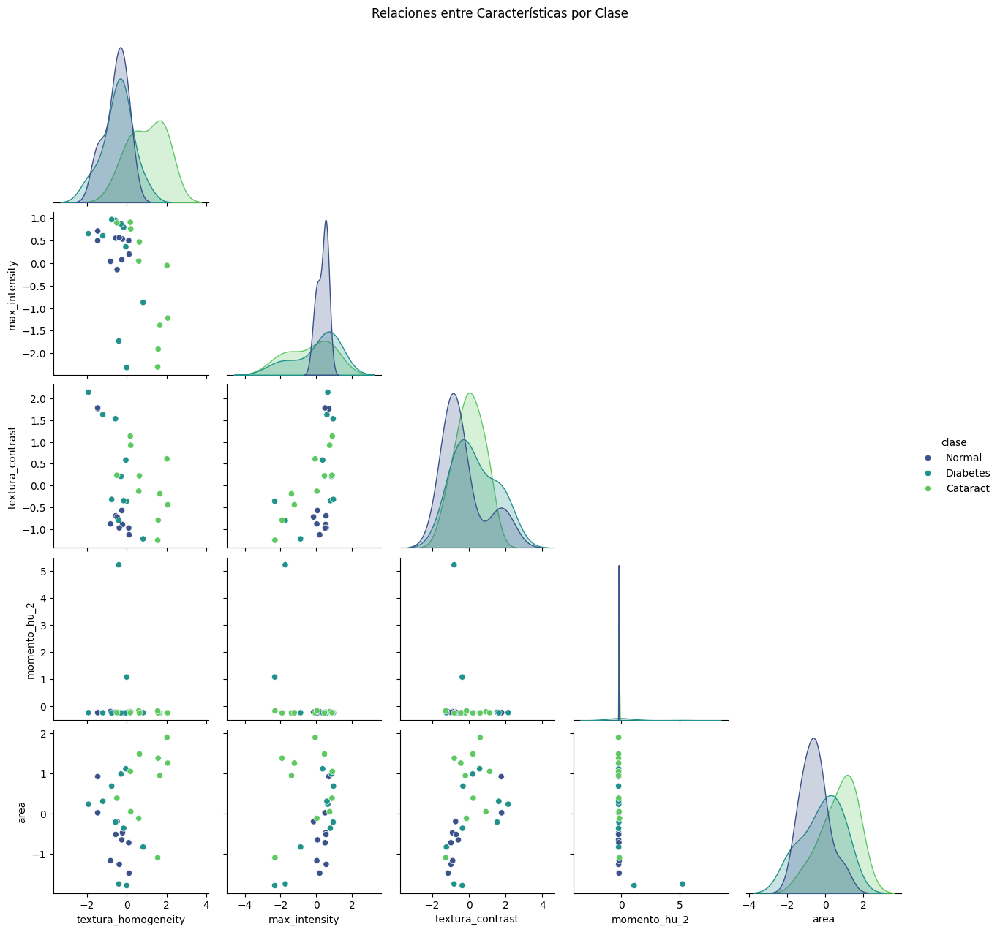

In [ ]:
# 6. Pairplot de características más relevantes
features_seleccionadas = [
    'textura_homogeneity',
    'max_intensity',
    'textura_contrast',
    'momento_hu_2',
    'area'
]

sns.pairplot(df_scaled, vars=features_seleccionadas,
             hue='clase', palette='viridis', corner=True)
plt.suptitle('Relaciones entre Características por Clase', y=1.02)
plt.show()

En el pairplot buscamos visualizar como se discriminan las clases usando combinaciones de caracteristicas con:

- Alta capacidad de separación visual
- Baja redundancia entre si
- Relevancia clínica y estadística

Observamos de la imagen:
- textura_homogenety es una variable excelente para diferenciar catarata de las otras clases.
- max_intensity es especialmente util para separar a las imagenes de pacientes sanos de las imagenes de pacientes enfermos.
- textura_contrast es util para diferenciar Diabetes de la clase Normal y en parte de la clase Catarata.
- momento_hu_2 es una variable que parece puede aportar más en combinación con otras.
- area, es util para separar catarata de normal, aunque se superpone en parte con la clase Diabetes



### 5. Resultados
---

<ipython-input-10-5da0e640b028>:41: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


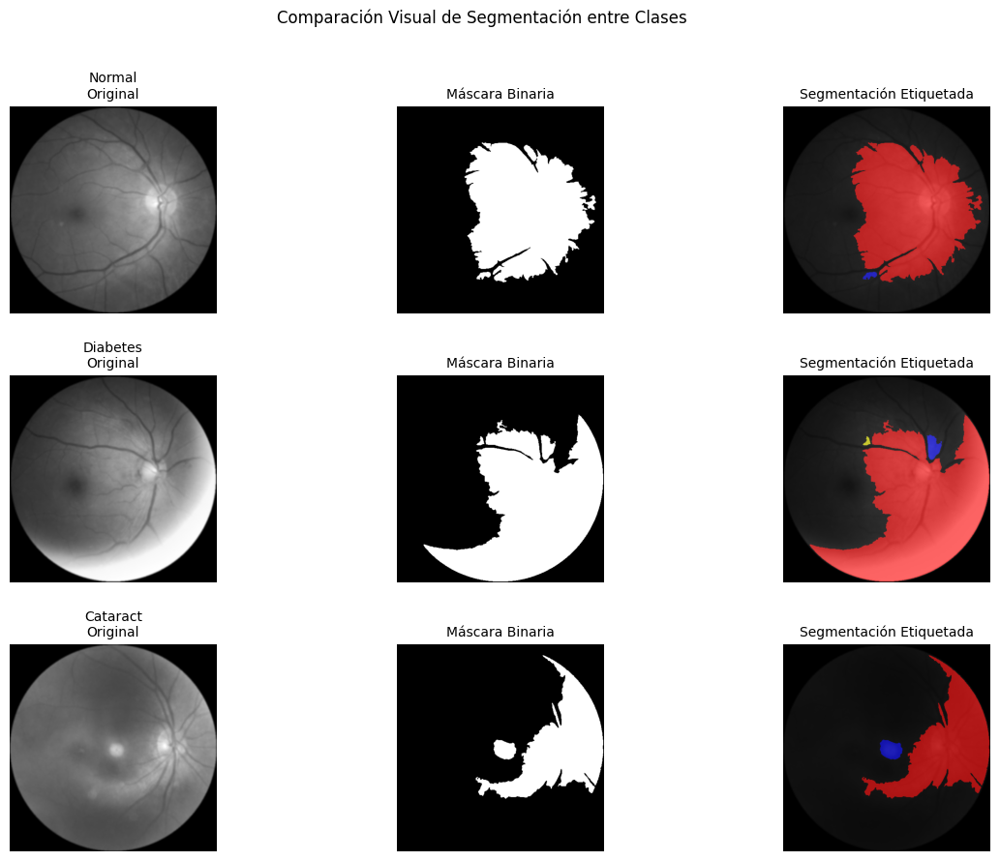

In [10]:
n_cols = 3  # Original, Máscara, Superposición

# Crear figura maestra
plt.figure(figsize=(15, 10))
gs = gridspec.GridSpec(len(clases), n_cols, wspace=0.1, hspace=0.3)

for i, clase in enumerate(clases):
    # Obtener primera imagen de cada clase
    try:
        fila = df_resultados[df_resultados['clase'] == clase].iloc[0]
        img_suave = fila['img_suave']
        mask = fila['binary_mask']

        # Procesar para visualización
        label_img = measure.label(mask)
        overlay = label2rgb(label_img, image=img_suave, bg_label=0, alpha=0.6)

        # Mostrar imagen original
        ax0 = plt.subplot(gs[i, 0])
        ax0.imshow(img_suave, cmap='gray')
        ax0.set_title(f'{clase}\nOriginal', fontsize=10)
        ax0.axis('off')

        # Mostrar máscara binaria
        ax1 = plt.subplot(gs[i, 1])
        ax1.imshow(mask, cmap='gray')
        ax1.set_title('Máscara Binaria', fontsize=10)
        ax1.axis('off')

        # Mostrar superposición
        ax2 = plt.subplot(gs[i, 2])
        ax2.imshow(overlay)
        ax2.set_title('Segmentación Etiquetada', fontsize=10)
        ax2.axis('off')

    except Exception as e:
        print(f"Error mostrando {clase}: {str(e)}")
        continue

plt.suptitle('Comparación Visual de Segmentación entre Clases', y=0.98, fontsize=12)
plt.tight_layout()
plt.show()


De la comparación podemos observar lo siguiente:

- En las imagenes de pacientes sanos se observa en la mascara binaria pocas regiones pequeñas y aisladas, luego en la imagen donde se superpone la segmentación vemos apenas 2 regiones con estructuras anatómicas comunes.

- En la imagen concerniente a Diabetes hay una mayor cantidad de regiones, las cuales son irregulares y conectadas, posiblemente por lesiones como hemorragias.

- En la imagen de mascara binaria referente a la catarata se ve como hay areas difusas con bordes menos definidos.

Diabetes es la que muestra una mayor complejidad estructural con respecto a la de pacientes sanos.

In [ ]:
# Contar el número de regiones por clase
for clase in clases:
    mask = df_resultados[df_resultados['clase'] == clase].iloc[0]['binary_mask']
    num_regiones = len(np.unique(measure.label(mask))) - 1  # Restar 1 para excluir el fondo
    print(f"{clase}: {num_regiones} regiones segmentadas")

print('\n')

for clase in clases:
    mask = df_resultados[df_resultados['clase'] == clase].iloc[0]['binary_mask']
    props = measure.regionprops(measure.label(mask))
    areas = [prop.area for prop in props]
    print(f"{clase}: {len(areas)} regiones, Área total = {sum(areas):.0f} px², Área/región = {np.mean(areas):.0f} ± {np.std(areas):.0f} px²")

Normal: 2 regiones segmentadas
Diabetes: 4 regiones segmentadas
Cataract: 2 regiones segmentadas


Normal: 2 regiones, Área total = 77123 px², Área/región = 38562 ± 38150 px²
Diabetes: 4 regiones, Área total = 120394 px², Área/región = 30098 ± 50430 px²
Cataract: 2 regiones, Área total = 107042 px², Área/región = 53521 ± 53251 px²


El conteo de regiones ayuda a discriminar diabetes, pero no diferencia bien Normal vs. Cataract (requiere análisis de textura/área). Por otra parte, el área total en Diabetes es 1.2× mayor que en Normal.

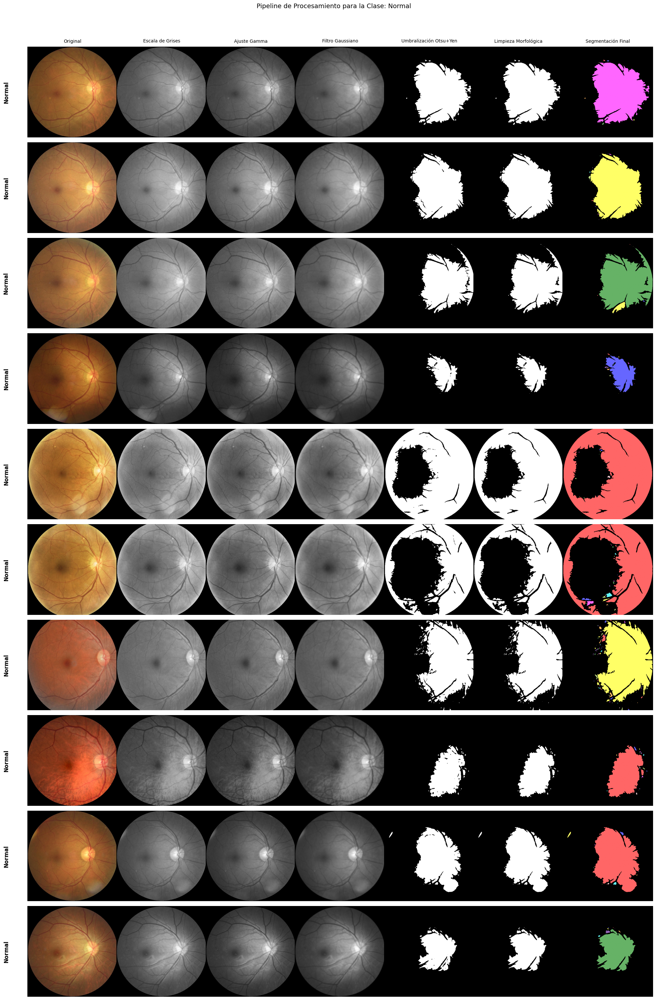

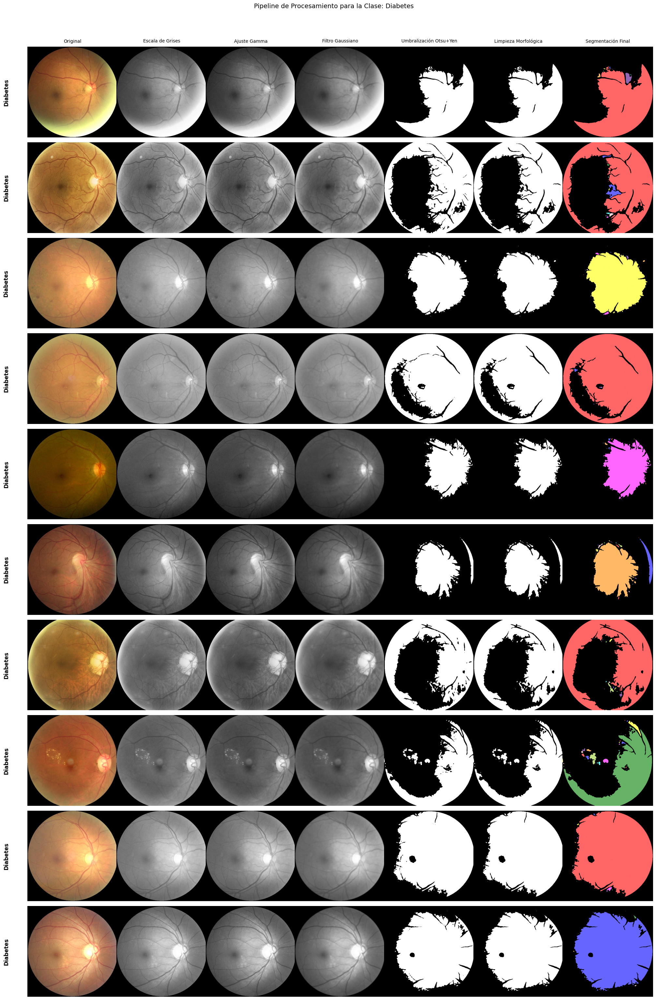

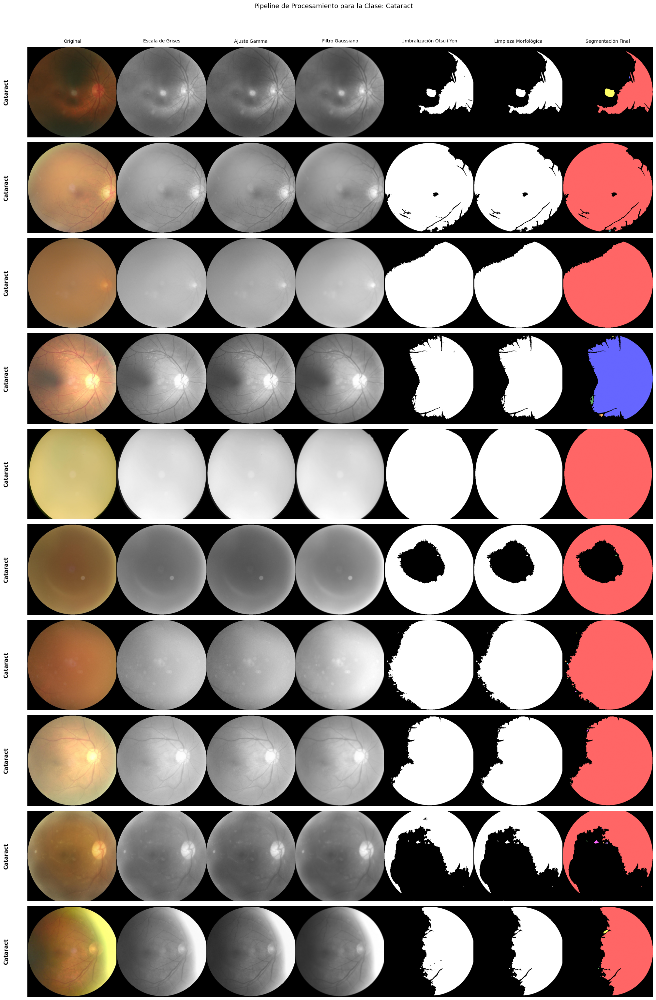

In [25]:
# Pasos de procesamiento
pasos_procesamiento = [
    ('Original', lambda img: img),
    ('Escala de Grises', lambda img: color.rgb2gray(img)),
    ('Ajuste Gamma', lambda img: exposure.adjust_gamma(img, gamma=1.2)),
    ('Filtro Gaussiano', lambda img: filters.gaussian(img, sigma=1.5)),
    ('Umbralización Otsu+Yen', lambda img: img >= (filters.threshold_otsu(img) + filters.threshold_yen(img))/2),
    ('Limpieza Morfológica', lambda img: (
        morphology.area_opening(img, area_threshold=64),
        morphology.area_closing(img, area_threshold=200),
        morphology.remove_small_objects(img, min_size=200),
        morphology.remove_small_holes(img, area_threshold=150)
    )[-1]),  # Toma el último resultado
    ('Segmentación Final', lambda img: label2rgb(measure.label(img), image=img, bg_label=0, alpha=0.6))
]

# Crear figura para mostrar todas las imágenes de cada clase
for i, clase in enumerate(clases):
    # Obtener la lista de archivos en la carpeta de la clase
    carpeta_clase = os.path.join(carpeta_base, clase)
    archivos = os.listdir(carpeta_clase)  # Obtener todos los archivos en la carpeta

    # Solo tomar las imagenes
    archivos_imagenes = [f for f in archivos if f.endswith('.jpg')]

    # Crear subgráficos para mostrar las imágenes procesadas
    fig, axs = plt.subplots(len(archivos_imagenes), len(pasos_procesamiento), figsize=(20, len(archivos_imagenes) * 3))
    plt.subplots_adjust(wspace=0.05, hspace=0.3)

    # Iterar sobre todas las imágenes de la carpeta de la clase
    for img_idx, archivo_imagen in enumerate(archivos_imagenes):
        img_path = os.path.join(carpeta_clase, archivo_imagen)

        img_original = io.imread(img_path)

        # Procesar cada paso para esta imagen
        img_actual = img_original.copy()
        for j, (nombre_paso, funcion) in enumerate(pasos_procesamiento):
            try:
                img_actual = funcion(img_actual)

                # Mostrar imagen en el subgráfico
                ax = axs[img_idx, j]
                if j == len(pasos_procesamiento)-1:  # Última columna (segmentación)
                    ax.imshow(img_actual)
                else:
                    ax.imshow(img_actual, cmap='gray')

                ax.axis('off')
                if img_idx == 0:  # Títulos solo en la primera fila
                    ax.set_title(nombre_paso, fontsize=10, pad=10)

                # Texto descriptivo
                if j == 0:  # Primera columna
                    ax.text(-0.2, 0.5, clase, rotation=90, va='center', ha='right',
                            transform=ax.transAxes, fontsize=12, fontweight='bold')

            except Exception as e:
                print(f"Error en {clase}, imagen {archivo_imagen}, paso {nombre_paso}: {str(e)}")
                ax.imshow(np.zeros_like(img_original), cmap='gray')
                ax.axis('off')

    # Título general para la clase
    plt.suptitle(f'Pipeline de Procesamiento para la Clase: {clase}', y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()


El pipeline muestra como se extrae de forma eficiente las regiones de interés en imagenes de fondo de ojo.

Conclusion

Este trabajo implementó un **pipeline completo de análisis cuantitativo** para imágenes retinales, logrando diferenciar tres clases clínicas (tejido normal, retinopatía diabética y cataratas) mediante técnicas de procesamiento digital de imágenes. La combinación de umbralización híbrida y operaciones morfológicas demostro ser efectiva para aislar estructuras patológicas, se identificaron 5 metricas claves para el diagnostico diferencial, las matrices de correlacion revelaron patrones unicos. La combinacion de las diferentes tecnicas permite diferencia claramente patologías oculares, siendo una herramienta con potencial para asistir en diagnosticos complejos
